---
title: "7. Harmony and melody"
subtitle: "Harmony, melody, and musical structure"
---

Earlier units on [acoustics](acoustics.ipynb) and [psychoacoustics](psychoacoustics.ipynb) introduced frequency, spectrum, and pitch perception; this chapter reconnects those ideas to note names, intervals, scales, and chords, working between *perception* and *interpretation* in the [four levels of description](#levels-of-description): a pitch is heard, but a tonic, a cadence, and a deceptive resolution are cultural categories laid over what is heard.

## Tones

The chapter looks at how frequencies interact both horizontally and vertically. Horizontal organisation gives rise to melodies: sequences of pitches unfolding over time, often shaped by rhythmic patterns. Vertical organisation produces intervals, harmonies, and textures, as several pitches sound together or overlap. First, though, we need to define the tone.

In music psychology, a *tone* is a sound with a specific frequency, timbral quality, and temporal shape that the auditory system interprets as having a definite *pitch*. How we perceive tones depends both on the physical properties of the sound wave (frequency, amplitude, harmonic content) and on the way our brains process these signals. Tones are the building blocks of musical perception, letting us distinguish melodies, harmonies, and textures.

Tones can also be generated, analysed, and manipulated with digital tools. Synthesisers build them by combining waveforms, while audio analysis software extracts pitch and timbre features from recordings. Pitch detection algorithms and spectral analysis underpin music information retrieval, automatic transcription, and digital instrument design.

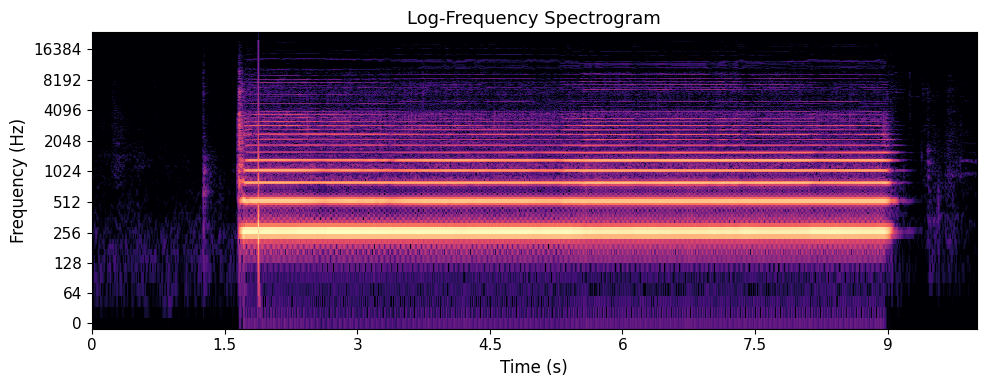

In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np 
import IPython.display as ipd

audio_path = "audio/SoundAction122-Saxophone_tone.wav"
y, sr = librosa.load(audio_path, sr=None)

S = librosa.stft(y)
S_db = librosa.amplitude_to_db(abs(S), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.title('Log-Frequency Spectrogram')
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()

ipd.Audio(y, rate=sr)


```{exercise}
First, describe this sound by only inspecting the spectrogram. Then, after listening, discuss how your interpretation of the sound matched what you could hear.
```

```{note}
A *tone* is an auditory event with a specific frequency and timbre, while a *note* is its symbolic representation in musical notation. This distinction is important for understanding how music is both heard and written.
```

### Pitch

[Pitch](https://en.wikipedia.org/wiki/Pitch_(music)) is the psycho-physiological correlate of [frequency](https://en.wikipedia.org/wiki/Frequency) that lets us hear one sound as higher or lower than another. It is closely related to the [fundamental frequency](https://en.wikipedia.org/wiki/Fundamental_frequency) of a tone, but the relationship is not one-to-one. As you may recall from the Acoustics chapter, most instrument tones are not pure sine waves. Musical, "pitched" instruments generally produce a fundamental frequency (often abbreviated f0), which defines the perceived pitch. Additional overtones define the timbre of the instrument. Many musical instruments have overtones that are in a "harmonic" relationship to the fundamental frequency (f1, f2, etc.). For a tone with a fundamental frequency of 220 Hz, the harmonic overtones—sometimes called [partials](https://en.wikipedia.org/wiki/Partial_(music))—are 440 Hz, 660 Hz, 880 Hz, etc. The individual partials of a complex sound are typically not heard as separate; our perceptual system fuses them into a single sound.

The pitch of [harmonic tones](https://en.wikipedia.org/wiki/Harmonic_series_(music)) generally corresponds to the fundamental frequency (f0). However, the brain can infer a fundamental frequency (and thus perceive pitch) from complex tones even when a fundamental component is absent. This is the [missing fundamental](https://en.wikipedia.org/wiki/Missing_fundamental) you met in [psychoacoustics](psychoacoustics.ipynb), where it appeared as evidence that pitch perception is constructive. In a musical context it usually goes by its other name, *virtual pitch*, and the demonstrations below put it to work: with the right partials and no fundamental at all, you will hear a melody that is not physically in the signal.

Below is a sequence of simple (sine) tones at different frequencies.

### Demo: just vs equal-tempered thirds

A just major third is the simple ratio 5:4; the equal-tempered third used on a piano is slightly wider (the twelfth root of two, to the fourth power). When you sound the two notes together, the just third locks; the equal-tempered one beats gently as nearby harmonics drift in and out of phase.

In [2]:
import numpy as np
from IPython.display import Audio, display

sr = 22050
dur = 3.0
t = np.linspace(0, dur, int(sr * dur), endpoint=False)

def tone(f):
    return sum((1.0 / h) * np.sin(2 * np.pi * f * h * t) for h in range(1, 6))

root = 261.63                       # C4
just = 0.1 * (tone(root) + tone(root * 5 / 4))
equal = 0.1 * (tone(root) + tone(root * 2 ** (4 / 12)))

print("Major third, just intonation (5:4) - stable:")
display(Audio(just, rate=sr))
print(f"Major third, equal temperament ({2 ** (4/12):.4f}:1) - gentle beating:")
display(Audio(equal, rate=sr))


Major third, just intonation (5:4) - stable:


Major third, equal temperament (1.2599:1) - gentle beating:


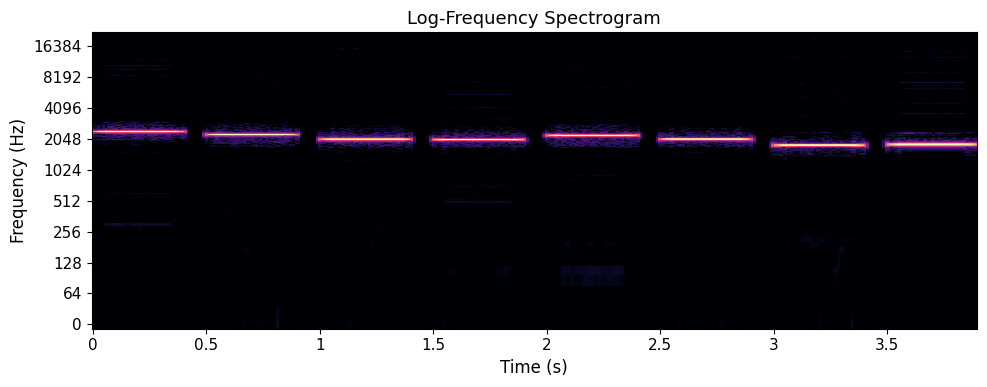

In [3]:
import librosa

import librosa.display
import matplotlib.pyplot as plt

y_tones, sr_tones = librosa.load("audio/week7_tones1.mp3", sr=None)
S_tones = librosa.stft(y_tones)
S_tones_db = librosa.amplitude_to_db(abs(S_tones), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(S_tones_db, sr=sr_tones, x_axis='time', y_axis='log')
plt.title('Log-Frequency Spectrogram')
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()

import IPython.display as ipd

ipd.Audio(y_tones, rate=sr_tones)

If we add some partials (multiples) below each tone, can you start to hear a familiar melody?

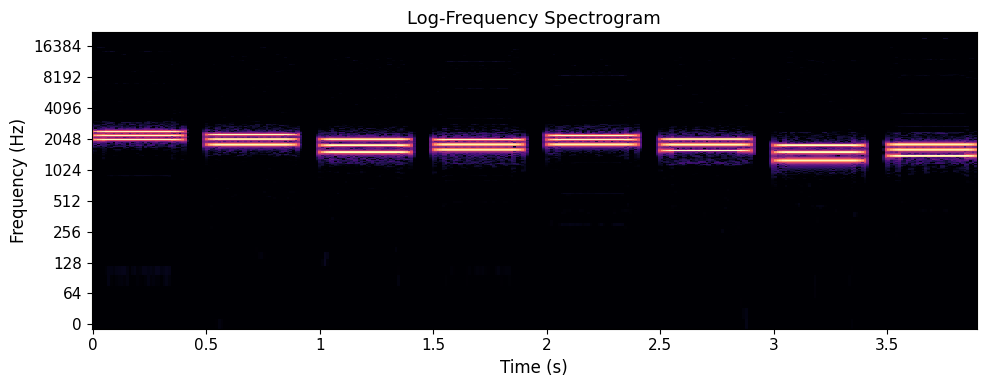

In [4]:
import librosa

import librosa.display
import matplotlib.pyplot as plt

y_tones, sr_tones = librosa.load("audio/week7_tones2.mp3", sr=None)
S_tones = librosa.stft(y_tones)
S_tones_db = librosa.amplitude_to_db(abs(S_tones), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(S_tones_db, sr=sr_tones, x_axis='time', y_axis='log')
plt.title('Log-Frequency Spectrogram')
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()

import IPython.display as ipd

ipd.Audio(y_tones, rate=sr_tones)

If we then rearrange these partials slightly, we can induce an even stronger sense of virtual pitch, that is, various missing fundamental frequencies which are not physically present in the tones themselves:


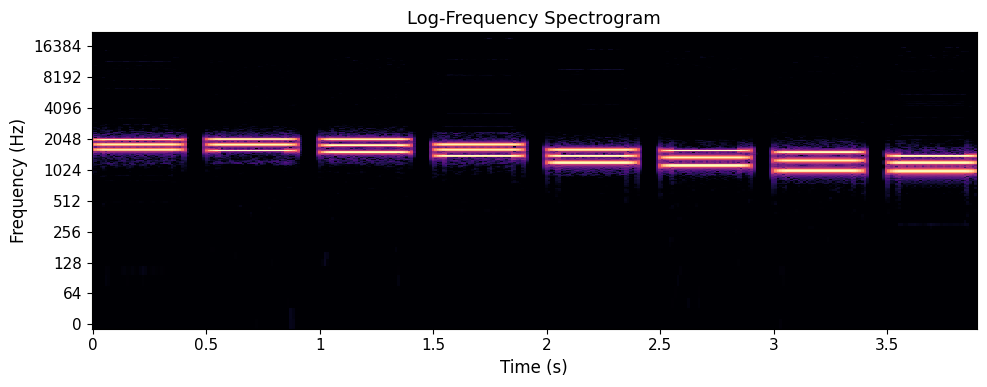

In [5]:
import librosa

import librosa.display
import matplotlib.pyplot as plt

y_tones, sr_tones = librosa.load("audio/week7_tones3.mp3", sr=None)
S_tones = librosa.stft(y_tones)
S_tones_db = librosa.amplitude_to_db(abs(S_tones), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(S_tones_db, sr=sr_tones, x_axis='time', y_axis='log')
plt.title('Log-Frequency Spectrogram')
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()

import IPython.display as ipd

ipd.Audio(y_tones, rate=sr_tones)

What happens is that your brain creates a virtual fundamental based on "calculating" the underlying frequencies part of the harmonic series.

```{image} figures/harmony-and-melody/week7_image1.png
:width: 100%
```

*Image source: Toiviainen, P. (2015). Lecture materials for Music Perception. University of Jyväskylä.*

### Constant-Q transform

So far we have looked at regular spectrograms, both linear and logarithmic. Each has its uses, but the logarithmic version represents human hearing more closely. For pitch, the [constant-Q transform (CQT)](https://en.wikipedia.org/wiki/Constant-Q_transform) works better still, since it maps frequencies to musical notes. Where the standard spectrogram uses a linear frequency scale, the CQT uses a logarithmic one that matches how notes are spaced, with each octave divided into equal steps. This makes it easier to see which pitch classes are present, which suits tasks like chord recognition, key detection, and melody analysis.

Real musical notes are not pure, since they carry overtones and partials that are not perfectly harmonic. In a CQT spectrogram, this shows up as energy spread across several frequency bins rather than sitting only at the fundamental. We can therefore see both the main pitches and their harmonic content, which tells us about the timbre and structure of the sound.

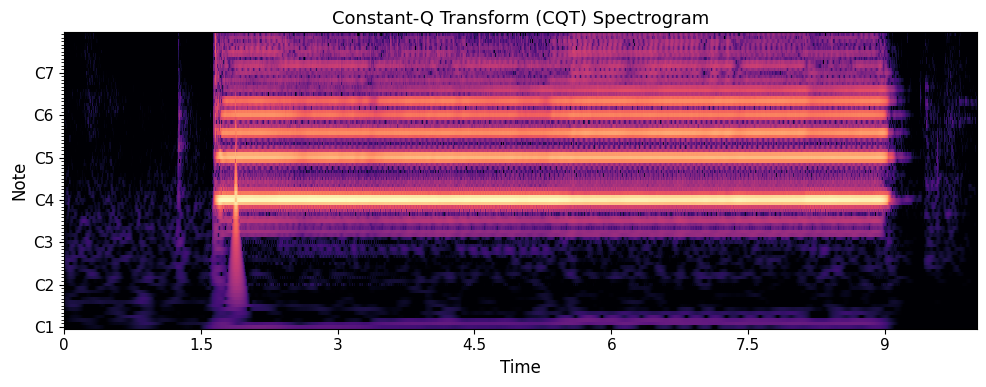

In [6]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np 
import IPython.display as ipd

audio_path = "audio/SoundAction122-Saxophone_tone.wav"
y, sr = librosa.load(audio_path, sr=None)
C = librosa.cqt(y, sr=sr)
C_db = librosa.amplitude_to_db(np.abs(C), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(C_db, sr=sr, x_axis='time', y_axis='cqt_note')
plt.title('Constant-Q Transform (CQT) Spectrogram')
plt.tight_layout()
plt.show()

ipd.Audio(y, rate=sr)


### Pitch class

In music, a [pitch class](https://en.wikipedia.org/wiki/Pitch_class) is a set of pitches that are a whole number of octaves apart, e.g., the pitch class C consists of the Cs in all octaves. Humans perceive the notes in a tonal scale as repeating once per octave. This provides the basis for producing and perceiving melodic patterns based on relative pitch relationships, that is, *relative* to a pitch class. [Absolute pitch](https://en.wikipedia.org/wiki/Absolute_pitch) ability, on the other hand, is the ability to recognise (or reproduce) specific pitches without the help of a reference pitch and pitch class.

```{image} figures/harmony-and-melody/week7_image3.jpg
:width: 100%
```

*Image Source*: Trainor, Laurel & Unrau, A.J.. (2012). Development of pitch and music perception. Springer Handbook of Auditory Research: Human Auditory Development. 223-254.

### Chromagram

A [chromagram](https://en.wikipedia.org/wiki/Chroma_feature) visualises the intensity of each of the 12 pitch classes (C, C#, D, ..., B) over time, regardless of octave. Below is a chromagram of the saxophone tone used above. Notice how the algorithm is less certain during the noisy attack and release portions, but clearly identifies the main pitch (C) during the sustained part of the tone. The presence of energy in the fifth (G) and third (E) pitch classes reflects their harmonic relationship to the tonic (C). Chromagrams are useful for analysing harmonic and melodic content in music, as they abstract away octave information and focus on pitch class structure.

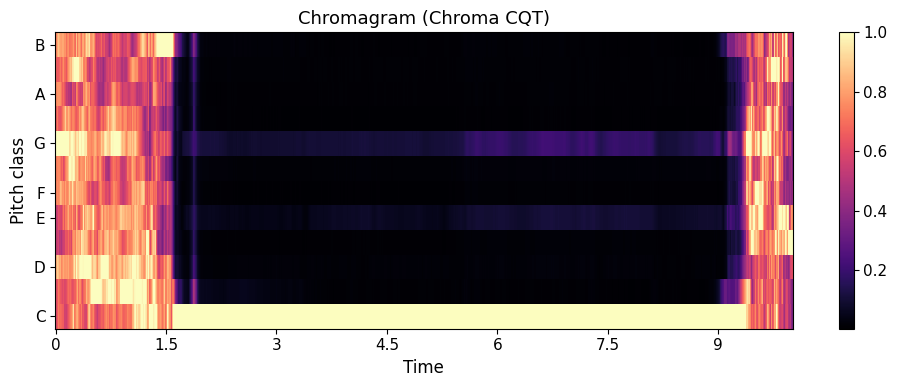

In [7]:
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', sr=sr)
plt.colorbar()
plt.title('Chromagram (Chroma CQT)')
plt.tight_layout()
plt.show()

ipd.Audio(y, rate=sr)

```{note}
Recall that [timbre](https://en.wikipedia.org/wiki/Timbre), often called "sound colour," is the quality of a sound that distinguishes different instruments or voices, even when they produce the same pitch and loudness. Even for a short, single-pitched tone like the example above, timbre comes into play. Note also that the timbre is not stable, since the spectral content fluctuates over time, creating the richness you find in musical tones.
```

### Tonality and harmonic expectation

[Tonality](https://en.wikipedia.org/wiki/Tonality) is the organisation of pitches and chords around a central note called the tonic, creating a sense of hierarchy and resolution in music. In Western music, tonality underlies the concept of *key signatures* (e.g., "C major", "A minor"), where certain notes and chords feel stable (restful) while others create tension and seek resolution. This hierarchy is learned implicitly through exposure to music, forming a [cognitive schema](https://en.wikipedia.org/wiki/Schema_(psychology)) that shapes our expectations of which notes or chords will follow. {cite:t}`Krumhansl2001` measured these hierarchies experimentally, and the resulting tonal profiles are still the basis of most computational key-finding, including the estimate you will meet in [machine listening](machine-listening.ipynb). Tonality is also supported by acoustics. The most important notes in a scale, such as the third and fifth, share harmonic overtones with the tonic, reinforcing their sense of belonging. Even without formal music theory training, listeners develop an intuitive sense of tonality and harmonic expectation through cultural experience.

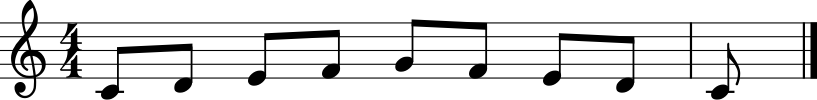

In [8]:
import music21

# Define a simple melody in C major: C D E F G F E D C
melody_notes = ['C4', 'D4', 'E4', 'F4', 'G4', 'F4', 'E4', 'D4', 'C4']
melody = music21.stream.Stream()
for n in melody_notes:
    melody.append(music21.note.Note(n, quarterLength=0.5))

# Show the musical score (renders in Jupyter if MuseScore or similar is installed)
try:
    melody.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


### Cultural frames beyond Western tonality

The concepts in this chapter are often introduced through Western tonal theory, but melody and harmony are organised differently across musical cultures. Some traditions use scales and intonation systems that do not map neatly onto 12-tone equal temperament, while others prioritise melodic motion, ornamentation, drone relationships, or modal centres over functional chord progressions.

Examples include microtonal pitch systems, raga-based melodic organisation, maqam traditions with characteristic intonation and melodic pathways, and ensemble practices where heterophony is central. These approaches show that harmony and melody are not universal rule sets but culturally shaped listening and performance practices.

Analysis tools are theory-dependent. If we only use Western note grids and chord labels, we may miss musically important details in other repertoires.

### Statistical learning, expectation, and enculturation

Harmonic and melodic listening rely on implicit knowledge of regularities in the music you have heard, which is often studied under statistical learning and implicit harmony. Enculturated listeners internalise probabilities (which chord tends to follow which, typical melodic skips vs steps) that shape expectation and surprise. {cite:t}`Huron2006` builds a general theory of musical affect on exactly this mechanism, and {cite:t}`Margulis2018` is a short, accessible way in. Those expectations are culture-relative, since competence in one grammar does not transfer wholesale to another.

When you analyse scores or audio, separate three layers:

1. **Acoustic facts** (intervals, spectra, roughness),
2. **Style-specific syntax** (voice-leading norms, modal centres, idiomatic ornament),
3. **Analytic vocabulary** (Roman numerals, chord labels, computer features), where each tool reveals some things and hides others.

Cross-traditional comparison should name the tool’s assumptions (see also *Cultural Frames Beyond Western Tonality* earlier in this chapter).


## Harmony

[Harmony](https://en.wikipedia.org/wiki/Harmony) is the simultaneous sounding of different pitches, combined into intervals and chords and shaped by timbre and texture. These combinations carry much of the emotional tone and complexity of a piece, and they can evoke a wide range of responses in the listener.

### Intervals

An [interval](https://en.wikipedia.org/wiki/Interval_(music)) is the distance between two pitches, measured in steps or frequency ratios. Intervals are the building blocks of harmony, as they define the relationships between notes played together or in succession. In Western music theory, intervals are named by counting the number of letter names from the lower to the higher note (e.g., C to E is a third). They can be major, minor, perfect, augmented, or diminished.

The human brain is sensitive to the relationships between pitches, perceiving certain combinations as *[consonant](https://en.wikipedia.org/wiki/Consonance_and_dissonance)* (pleasant or stable) and others as *dissonant* (tense or unstable). For example, some intervals, like octaves and perfect fifths, are perceived as consonant, while others, like minor seconds or tritones, are more dissonant. These perceptual responses are influenced by cultural exposure, musical training, and innate auditory processing mechanisms. In the [Interval lab](https://fourms.github.io/sensingsoundandmusic/apps/interval-lab/) app you can play any interval with two complex tones, compare just intonation with equal temperament, and rank intervals by consonance against typical listener ratings.

Intervals form the basis for chords and harmonic progressions. The combination of intervals within a chord determines its character and function.

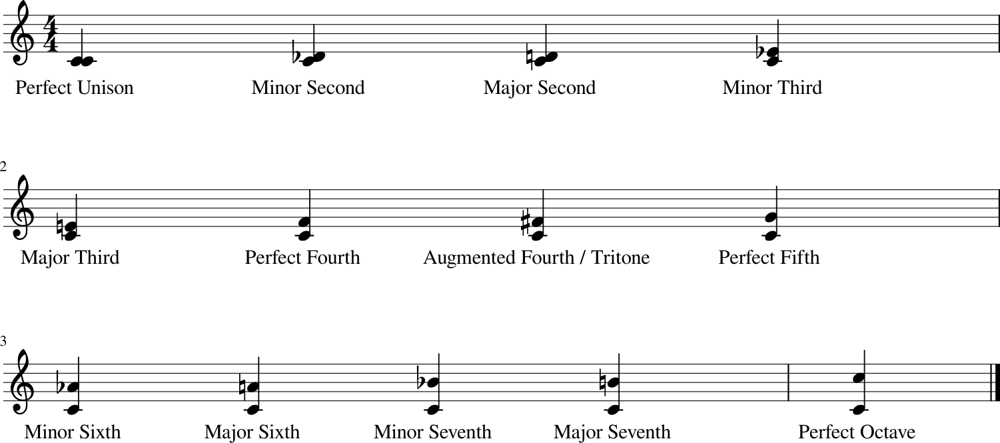

In [9]:
import music21

# Define the root note
root_note = 'C4'

# Define intervals from Perfect Unison (P1) to Perfect Octave (P8)
intervals = [
    ('P1', 'Perfect Unison'),
    ('m2', 'Minor Second'),
    ('M2', 'Major Second'),
    ('m3', 'Minor Third'),
    ('M3', 'Major Third'),
    ('P4', 'Perfect Fourth'),
    ('A4', 'Augmented Fourth / Tritone'),
    ('P5', 'Perfect Fifth'),
    ('m6', 'Minor Sixth'),
    ('M6', 'Major Sixth'),
    ('m7', 'Minor Seventh'),
    ('M7', 'Major Seventh'),
    ('P8', 'Perfect Octave')
]

# Create a stream for the intervals
interval_stream = music21.stream.Stream()
for intvl, label in intervals:
    n1 = music21.note.Note(root_note, quarterLength=0.7)
    n2 = music21.interval.Interval(intvl).transposeNote(n1)
    chord = music21.chord.Chord([n1, n2], quarterLength=1)
    chord.addLyric(label)
    interval_stream.append(chord)

try:
    interval_stream.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


### Chords

A *chord* is a group of three or more notes played simultaneously. Chords are the foundation of Western harmony and are used to create progressions that define the structure and mood of a piece.

*Triads* are the most basic chords, consisting of three notes (root, third, fifth). Types include major, minor, diminished, and augmented triads.

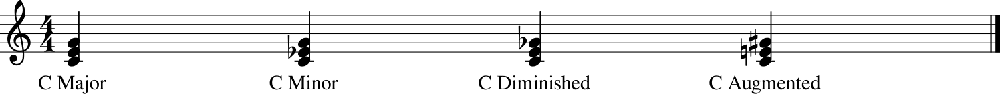

In [10]:
import music21

# Define root notes for C major, C minor, C diminished, and C augmented triads
triads = [
    (['C4', 'E4', 'G4'], 'C Major'),
    (['C4', 'Eb4', 'G4'], 'C Minor'),
    (['C4', 'Eb4', 'Gb4'], 'C Diminished'),
    (['C4', 'E4', 'G#4'], 'C Augmented')
]

triad_stream = music21.stream.Stream()
for notes, label in triads:
    chord = music21.chord.Chord(notes, quarterLength=1)
    chord.addLyric(label)
    triad_stream.append(chord)

try:
    triad_stream.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


More complex chords can be created by adding additional notes, such as sevenths, ninths, elevenths, and thirteenths, which creates richer harmonies.

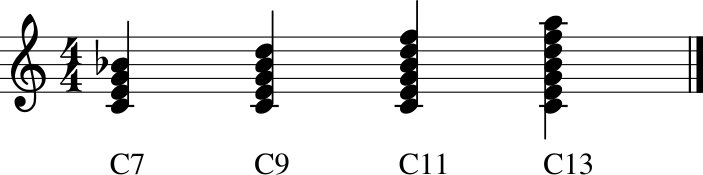

In [11]:
import music21

# Define C7, C9, C11, C13 chords
chords_extended = [
    (['C4', 'E4', 'G4', 'Bb4'], 'C7'),
    (['C4', 'E4', 'G4', 'Bb4', 'D5'], 'C9'),
    (['C4', 'E4', 'G4', 'Bb4', 'D5', 'F5'], 'C11'),
    (['C4', 'E4', 'G4', 'Bb4', 'D5', 'F5', 'A5'], 'C13')
]

extended_stream = music21.stream.Stream()
for notes, label in chords_extended:
    chord = music21.chord.Chord(notes, quarterLength=1)
    chord.addLyric(label)
    extended_stream.append(chord)

try:
    extended_stream.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


When combined, chords can create progressions that create movement and tension-resolution patterns in music (e.g., I–IV–V–I in classical music, or ii–V–I in jazz). In functional analysis, chords are defined by their roles (tonic, dominant, subdominant) and guide the listener’s expectations.

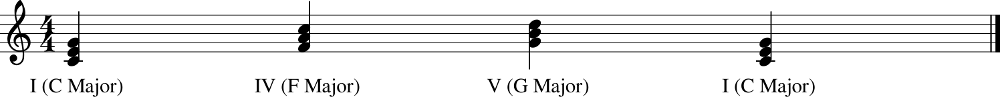

In [12]:
import music21

# I–IV–V–I progression in C major: C major, F major, G major, C major
chord_progression = [
    (['C4', 'E4', 'G4'], 'I (C Major)'),
    (['F4', 'A4', 'C5'], 'IV (F Major)'),
    (['G4', 'B4', 'D5'], 'V (G Major)'),
    (['C4', 'E4', 'G4'], 'I (C Major)')
]

progression_stream = music21.stream.Stream()
for notes, label in chord_progression:
    chord = music21.chord.Chord(notes, quarterLength=1)
    chord.addLyric(label)
    progression_stream.append(chord)

try:
    progression_stream.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


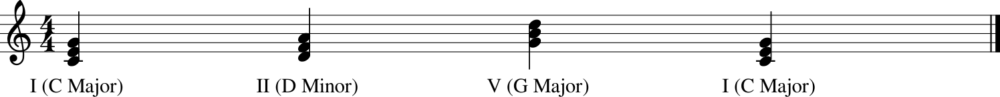

In [13]:
import music21

# I–II–V–I progression in C major: C major, D minor, G major, C major
chord_progression = [
    (['C4', 'E4', 'G4'], 'I (C Major)'),
    (['D4', 'F4', 'A4'], 'II (D Minor)'),
    (['G4', 'B4', 'D5'], 'V (G Major)'),
    (['C4', 'E4', 'G4'], 'I (C Major)')
]

progression_stream = music21.stream.Stream()
for notes, label in chord_progression:
    chord = music21.chord.Chord(notes, quarterLength=1)
    chord.addLyric(label)
    progression_stream.append(chord)

try:
    progression_stream.show()
except Exception:
    print(f"MuseScore not available; skipping score rendering.")


### Voice leading: connecting harmony and melody

[Voice leading](https://en.wikipedia.org/wiki/Voice_leading) describes how individual melodic lines move from one chord to the next. It links vertical harmony (what notes sound together) to horizontal melody (how lines unfold over time).

Good voice leading often aims for:

- **Stepwise motion:** move by small intervals where possible.
- **Common-tone retention:** keep shared notes in place between chords.
- **Balanced independence:** each line has a clear contour without excessive leaps.
- **Controlled parallels:** in many styles, consecutive parallel perfect fifths or octaves are avoided to preserve line independence.

When these principles are applied, chord progressions tend to sound smoother and more coherent.

### Cadences: patterns of tension and release

A [cadence](https://en.wikipedia.org/wiki/Cadence) is a harmonic-melodic pattern that signals a point of arrival, pause, or continuation.

Common cadence types in tonal music include:

- **Authentic cadence (V-I):** strongest sense of closure.
- **Half cadence (...-V):** ends on dominant, creating expectation.
- **Plagal cadence (IV-I):** softer resolution.
- **Deceptive cadence (V-vi):** expected resolution is delayed or redirected.

Cadences are heard through melodic behaviour, timing, articulation, and timbre, not only through chord labels. The same cadence can feel final, weak, or ambiguous depending on performance context.

Studying music theory through psychology and technology is revealing because the idealised concepts of Western art music rarely exist in real life. Even a simple triad on an acoustic piano carries considerable timbral complexity, as you can both hear and see below. Real sounds are shaped by the instrument's physical properties, the performer's nuances, and the acoustic environment, producing overtones and spectral features that go well beyond the abstract "perfect" chords of theory. To understand how musical structures are actually perceived, we need to analyse real audio signals.

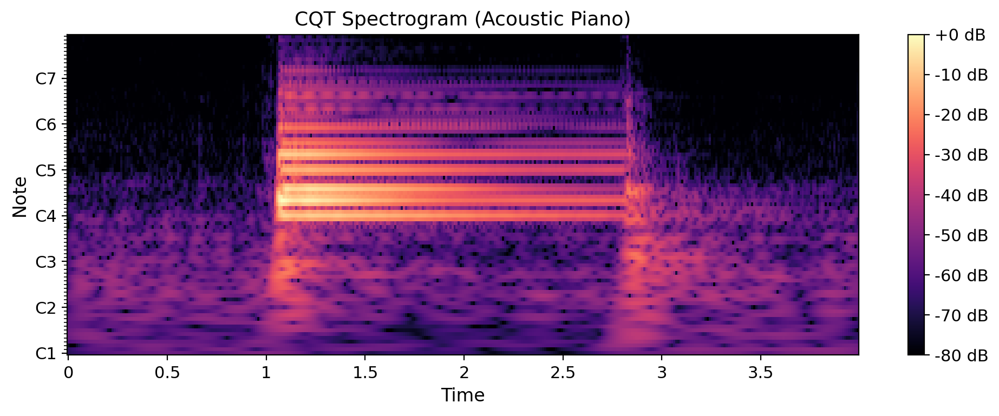

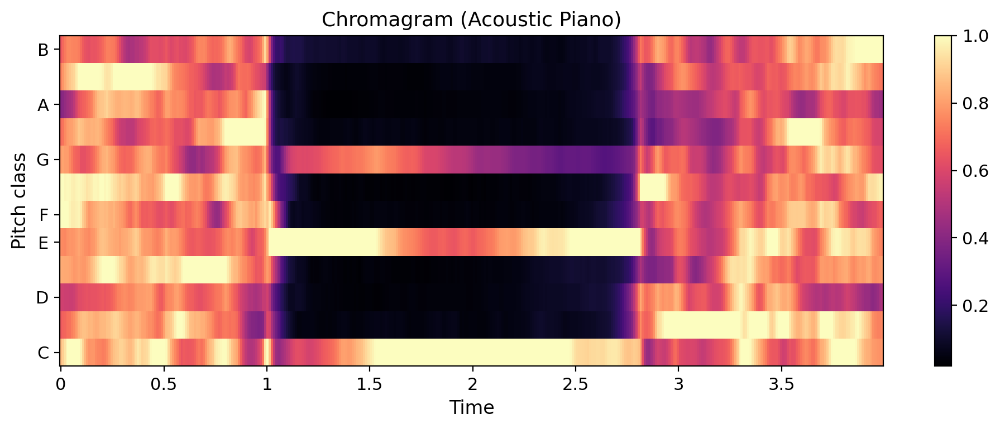

In [14]:
import librosa

import librosa.display
import matplotlib.pyplot as plt

# Load the audio file
y_piano, sr_piano = librosa.load("audio/SoundAction074-Acoustic_piano.wav", sr=None)

# CQT Spectrogram
C_piano = librosa.cqt(y_piano, sr=sr_piano)
C_piano_db = librosa.amplitude_to_db(abs(C_piano), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(C_piano_db, sr=sr_piano, x_axis='time', y_axis='cqt_note')
plt.colorbar(format='%+2.0f dB')
plt.title('CQT Spectrogram (Acoustic Piano)')
plt.tight_layout()
plt.show()

# Chromagram
chroma_piano = librosa.feature.chroma_cqt(y=y_piano, sr=sr_piano)
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_piano, x_axis='time', y_axis='chroma', sr=sr_piano)
plt.colorbar()
plt.title('Chromagram (Acoustic Piano)')
plt.tight_layout()
plt.show()

ipd.Audio(y_piano, rate=sr_piano)

## Melody

[Melody](https://en.wikipedia.org/wiki/Melody) is a sequence of musical notes perceived as a coherent whole. It is often the most recognisable and memorable part of a piece, and it carries much of how we engage with music emotionally and remember it.

From a psychological perspective, melody is the perception of an organised sequence of tones that form a distinct musical line. The brain tracks pitch contours, intervals, and rhythmic patterns to identify, segment, and remember melodies. This ability underlies our capacity to recognise tunes, anticipate musical phrases, and respond emotionally to music.

Technological advances have enabled detailed analysis and manipulation of melody. Pitch tracking algorithms can extract melodic lines from audio recordings, while MIDI editors and notation software allow for precise editing and visualisation. In music generation and AI composition, models learn melodic patterns from large datasets to create new, stylistically consistent melodies. Melody extraction and similarity algorithms are also used in music search, recommendation systems, and music information retrieval.

```{exercise}
Visit [FolkRNN](https://folkrnn.org/) and generate a new folk melody using the online interface. Listen to the generated melody and answer the following questions:
- Does the melody sound stylistically consistent with traditional folk music? Why or why not?
- Can you identify any repeating patterns or phrases in the melody?
- How might a system like FolkRNN be useful for composers or musicologists?
```

### Melodic expectation and closure

Just as harmony creates expectation, melody does too. Listeners learn statistical regularities in melodic motion and use them to predict likely continuations.

In tonal contexts, some scale degrees are heard as relatively unstable and often move toward more stable tones. For example, scale degree 7 often resolves to 1, and 2 often moves to 1 near phrase endings. Melodic closure is strengthened by several cues acting together:

- descending or arch-like contour toward phrase end,
- longer final note duration,
- rhythmic deceleration,
- alignment with a cadence in the harmony,
- timbral or dynamic settling.

These cues help explain why some phrases feel complete while others feel open or suspended, even when the pitch material is similar.

### Optional: melody extraction and error analysis

Automatic melody extraction is the computational counterpart of what you just did by ear. The exercise below is aimed at students who want to work with audio analysis tools; it is not required, and the chapter continues without it.

```{exercise} Optional: track a melody and diagnose the errors
Use a pitch-tracking method (for example, `librosa.pyin`) on two excerpts:
1. one mostly monophonic recording,
2. one polyphonic recording with accompaniment.

For each excerpt:
- Plot the extracted f0 contour over time.
- Mark at least three likely extraction errors.
- Classify each error type (octave jump, voicing error, onset uncertainty, vibrato overshoot, or noise-related break).
- Explain why the algorithm may have failed, using spectrogram evidence.

Finally, compare results across the two excerpts and summarise what this tells you about the relationship between timbre/texture and melody extraction reliability.
```


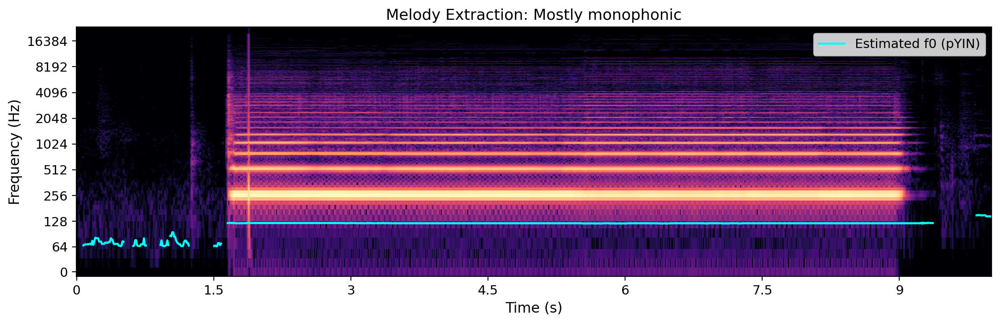

File: audio/SoundAction122-Saxophone_tone.wav
Voiced frame ratio: 0.89
Median estimated f0: 121.35 Hz


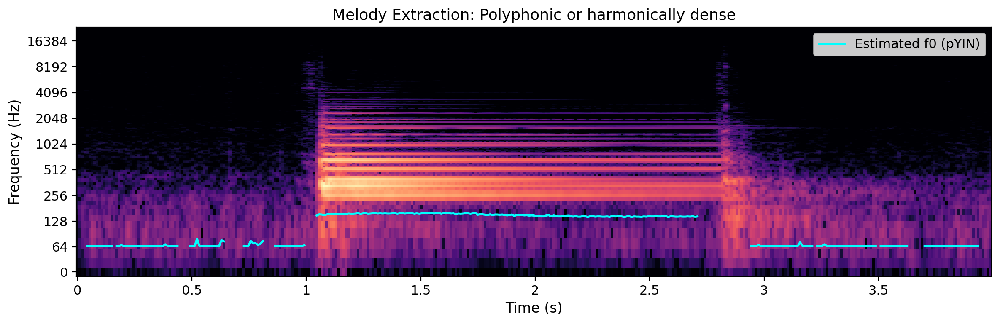

File: audio/SoundAction074-Acoustic_piano.wav
Voiced frame ratio: 0.85
Median estimated f0: 76.89 Hz

Listening references:
Monophonic example:


Polyphonic example:


In [15]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd

# Template audio examples (replace with your own files if needed)
mono_path = "audio/SoundAction122-Saxophone_tone.wav"
poly_path = "audio/SoundAction074-Acoustic_piano.wav"

def analyze_melody_extraction(audio_path, title, fmin="C2", fmax="C7"):
    y, sr = librosa.load(audio_path, sr=None)

    # Estimate fundamental frequency with pYIN
    f0, voiced_flag, voiced_prob = librosa.pyin(
        y,
        fmin=librosa.note_to_hz(fmin),
        fmax=librosa.note_to_hz(fmax),
    )

    times = librosa.times_like(f0, sr=sr)

    # Spectrogram for visual error analysis
    D = librosa.stft(y, n_fft=2048, hop_length=512)
    D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    plt.figure(figsize=(12, 4))
    librosa.display.specshow(
        D_db,
        sr=sr,
        hop_length=512,
        x_axis="time",
        y_axis="log",
        cmap="magma",
    )
    plt.plot(times, f0, color="cyan", linewidth=1.8, label="Estimated f0 (pYIN)")
    plt.title(f"Melody Extraction: {title}")
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.legend(loc="upper right")
    plt.tight_layout()
    plt.show()

    voiced_ratio = np.mean(voiced_flag) if voiced_flag is not None else np.nan
    valid_f0 = f0[~np.isnan(f0)]
    median_f0 = np.median(valid_f0) if len(valid_f0) > 0 else np.nan

    print(f"File: {audio_path}")
    print(f"Voiced frame ratio: {voiced_ratio:.2f}")
    print(f"Median estimated f0: {median_f0:.2f} Hz")

    return y, sr, f0, voiced_flag, voiced_prob

# Analyze one mostly monophonic and one more polyphonic/complex excerpt
y_mono, sr_mono, f0_mono, vf_mono, vp_mono = analyze_melody_extraction(
    mono_path, "Mostly monophonic"
)

y_poly, sr_poly, f0_poly, vf_poly, vp_poly = analyze_melody_extraction(
    poly_path, "Polyphonic or harmonically dense"
)

print("\nListening references:")
print("Monophonic example:")
ipd.display(ipd.Audio(y_mono, rate=sr_mono))
print("Polyphonic example:")
ipd.display(ipd.Audio(y_poly, rate=sr_poly))

# Suggested next step for students:
# Inspect where f0 diverges from visible harmonic ridges and annotate likely error types.


#### Error annotation worksheet (template)

If you did the exercise above, use this table to document your observations while reviewing the extraction plots.

| Excerpt | Time (s) | Observed issue | Error type | Evidence in spectrogram | Likely cause | Confidence |
|---|---:|---|---|---|---|---|
| Monophonic |  |  |  |  |  |  |
| Monophonic |  |  |  |  |  |  |
| Monophonic |  |  |  |  |  |  |
| Polyphonic |  |  |  |  |  |  |
| Polyphonic |  |  |  |  |  |  |
| Polyphonic |  |  |  |  |  |  |

Suggested error-type labels: octave jump, voicing error, onset uncertainty, vibrato overshoot, noise-related break.

```{exercise} Optional: summarise the extraction errors
After filling the table, summarise your findings in 4-6 sentences:
1. Which excerpt produced more reliable f0 tracking?
2. Which error type was most frequent?
3. How did timbre and texture influence the algorithm's behaviour?
4. What one preprocessing or parameter change might improve results?
```


In [16]:
import csv
from pathlib import Path

# Create a blank worksheet CSV scaffold for offline annotation,
# stored in the data/ subfolder rather than at the book root.
output_csv = Path("data/melody_extraction_error_worksheet.csv")
output_csv.parent.mkdir(exist_ok=True)

fieldnames = [
    "excerpt",
    "time_s",
    "observed_issue",
    "error_type",
    "spectrogram_evidence",
    "likely_cause",
    "confidence",
]

rows = [
    {"excerpt": "Monophonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
    {"excerpt": "Monophonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
    {"excerpt": "Monophonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
    {"excerpt": "Polyphonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
    {"excerpt": "Polyphonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
    {"excerpt": "Polyphonic", "time_s": "", "observed_issue": "", "error_type": "", "spectrogram_evidence": "", "likely_cause": "", "confidence": ""},
]

with output_csv.open("w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(rows)

print(f"Worksheet scaffold saved to: {output_csv.resolve()}")
print("You can open this in a spreadsheet editor and fill in your annotations.")


Worksheet scaffold saved to: /home/alexanje/github/sensingsoundandmusic/book/data/melody_extraction_error_worksheet.csv
You can open this in a spreadsheet editor and fill in your annotations.


## Timbre, texture, and musical streams

Pitch and rhythm are only part of what we hear. This last group of topics concerns how simultaneous sounds are held apart or fused together, by timbre, by grouping principles, and by the way parts are layered.

### Timbre

Timbre was defined in [psychoacoustics](psychoacoustics.ipynb) as what lets us tell two sounds apart when pitch, loudness, and duration are the same. Here the question is what it does *musically*.

Timbre strongly influences how we hear both harmony and melody:

- In harmony, timbre affects blending and separation. A chord played by a string quartet can feel fused and smooth, while the same chord split across instruments with contrasting timbres can feel more segmented and tense.
- In melody, timbre helps define identity and continuity. We can often track a melodic line in a dense texture because its timbral profile remains relatively stable over time.
- In polyphonic listening, timbral contrast is one of the key cues for auditory stream segregation, making it easier to separate simultaneous voices.

From a technology perspective, timbre is central to music information retrieval and production. Features such as spectral centroid, spectral flux, MFCCs, and temporal envelope descriptors, all numerical summaries of a sound's spectrum and how it changes over time, are often used to classify instruments, detect playing techniques, and compare recordings. In arrangement and mixing, small timbral changes can alter perceived harmonic clarity, melodic prominence, and emotional impact.

```{exercise}
Listen to two recordings of the same melody played on different instruments (for example, flute and electric guitar):
- Which melodic features feel "the same" across versions?
- Which expressive qualities change because of timbre?
- How does the instrument choice affect your sense of tension, release, and musical character?
```

### Streams in musical textures

[Psychoacoustics](psychoacoustics.ipynb) introduced Bregman's *auditory scene analysis* {cite:p}`Bregman1990`: the way the auditory system sorts one incoming pressure wave into separate streams, using cues such as frequency proximity, common onset, continuity, and timbral similarity. Polyphonic music is that problem made deliberate.

Composers and arrangers work with the grouping cues rather than against them. Lines that stay in separate registers, enter at different moments, or carry contrasting timbres stay audible as independent voices; lines that share register, attack, and colour fuse into a single chord. That is why a fugue subject remains followable through dense counterpoint, why doubling a melody at the octave thickens it rather than adding a voice, and why an orchestrator can make five instruments sound like one instrument or like five.

The same principles set the ceiling for machines. Automatic transcription and source separation ([machine listening](machine-listening.ipynb)) are attempts to solve computationally what the auditory system does effortlessly, and they fail in the places where our own grouping is ambiguous.

```{image} figures/harmony-and-melody/01-Streaming_in_Auditory_Scene_Analysis.gif
:alt: Auditory stream analysis example
:width: 100%
```

*Figure: An example of how a series of stimuli can be grouped into separate streams ([Wikipedia](https://en.wikipedia.org/wiki/Auditory_scene_analysis)).*

### Gestalt theory in music perception

Auditory grouping draws on [Gestalt theory](https://en.wikipedia.org/wiki/Gestalt_psychology), which explains how humans organise sensory input into meaningful patterns and unified wholes. In music, Gestalt principles help us understand how listeners perceive coherent melodies, phrases, and motifs, even when the acoustic signal is complex or ambiguous.

Key Gestalt principles relevant to music:

- **Proximity:** Notes close together in time or pitch are grouped as part of the same melodic line.
- **Similarity:** Notes with similar timbre, loudness, or articulation are perceived as belonging together.
- **Continuity:** The brain prefers smooth, continuous melodic contours over abrupt changes.
- **Closure:** Listeners mentally "fill in" missing notes to perceive complete musical phrases.
- **Symmetry:** Symmetrical patterns or phrases (such as palindromic melodies or balanced phrase structures) are grouped as coherent wholes.
- **Figure-Ground:** The ability to focus on a primary melody (figure) while treating accompaniment or background sounds as secondary (ground).

These principles interact with auditory stream segregation, allowing us to follow individual voices in polyphonic music, recognise recurring themes, and make sense of complex musical textures. Gestalt theory has influenced both music psychology and computational models for music analysis, providing a framework for understanding how we perceive musical structure and form.

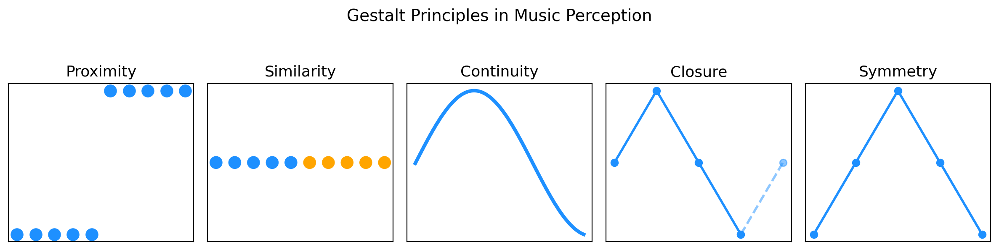

In [17]:
import numpy as np

import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 5, figsize=(12, 3))
fig.suptitle("Gestalt Principles in Music Perception")

# Proximity: notes close in pitch/time are grouped
x = np.arange(10)
y = np.concatenate([np.ones(5), np.ones(5)*3])
axs[0].scatter(x, y, s=100, color='dodgerblue')
axs[0].set_title("Proximity")
axs[0].set_xticks([])
axs[0].set_yticks([])

# Similarity: notes with similar color/timbre are grouped
colors = ['dodgerblue']*5 + ['orange']*5
axs[1].scatter(x, np.ones(10)*2, s=100, color=colors)
axs[1].set_title("Similarity")
axs[1].set_xticks([])
axs[1].set_yticks([])

# Continuity: smooth melodic contour
x = np.linspace(0, 9, 100)
y = np.sin(x/2) + 2
axs[2].plot(x, y, color='dodgerblue', lw=3)
axs[2].set_title("Continuity")
axs[2].set_xticks([])
axs[2].set_yticks([])

# Closure: incomplete phrase, brain fills gap
axs[3].plot([0, 1, 2, 3], [2, 3, 2, 1], 'o-', color='dodgerblue', lw=2)
axs[3].plot([3, 4], [1, 2], 'o--', color='dodgerblue', lw=2, alpha=0.5)
axs[3].set_title("Closure")
axs[3].set_xticks([])
axs[3].set_yticks([])

# Symmetry: palindromic phrase
y = [1, 2, 3, 2, 1]
axs[4].plot(range(5), y, 'o-', color='dodgerblue', lw=2)
axs[4].set_title("Symmetry")
axs[4].set_xticks([])
axs[4].set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

### Musical auditory illusions

[Psychoacoustics](psychoacoustics.ipynb) covered illusions that arise from the mechanics of hearing: masking, the missing fundamental, and the endless Shepard tone. The illusions here are *musical*, since they need scales, intervals, and two-handed textures to work at all.

[Diana Deutsch](https://en.wikipedia.org/wiki/Diana_Deutsch) is a psychologist whose experiments on auditory illusions {cite:p}`Deutsch1991Tritone` have uncovered perceptual phenomena that reveal how our brains organise and interpret complex sound patterns. Some of her most famous auditory illusions include:

- **The Tritone Paradox**: When two tones separated by a tritone (half an octave) are played in succession, some listeners perceive the sequence as ascending in pitch, while others hear it as descending. The direction of the perceived pitch change can vary depending on the listener's linguistic background and even their geographical origin, suggesting that pitch perception is influenced by both biology and experience.

- **The Octave Illusion**: When two tones an octave apart are alternately played to each ear (for example, high tone to the right ear, low tone to the left, then switching), listeners often perceive a single tone that alternates between ears and changes pitch, even though both tones are always present. This illusion demonstrates how the brain integrates and separates auditory information from both ears.

- **The Scale Illusion**: When ascending and descending musical scales are split between the two ears (with some notes sent to the left ear and others to the right), listeners tend to perceive coherent melodic lines that do not correspond to the actual physical input. The brain "reconstructs" the most plausible musical pattern, illustrating its tendency to organise sounds into familiar structures.

- **Phantom Tones**: In this illusion, repeating ambiguous speech sounds can cause listeners to "hear" words or phrases that are not actually present. The specific words perceived can vary between individuals, highlighting the role of expectation, language, and context in auditory perception.

Deutsch's work demonstrates that auditory perception is not a simple reflection of the physical properties of sound, but an active process shaped by cognitive, cultural, and neural factors. Her illusions are widely used in research, education, and demonstrations to illustrate how we hear and interpret sound.

For more examples and audio demonstrations, visit [Diana Deutsch's Auditory Illusions website](https://deutsch.ucsd.edu/psychology/pages.php?i=201). In the lecture below, *Musical Illusions and Phantom Words*, recorded by the Acoustical Society of America, Deutsch demonstrates some of these illusions herself:

<iframe width="560" height="315" src="https://www.youtube.com/embed/oF0g-UUqzgg?si=d5Id2ihd_KKVuGjt" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" referrerpolicy="strict-origin-when-cross-origin" allowfullscreen></iframe>

(If the video is unavailable, try the [archived page](https://web.archive.org/web/https://www.youtube.com/watch?v=oF0g-UUqzgg).)

### Texture

The last concept we will discuss this week is [texture](https://en.wikipedia.org/wiki/Texture_(music)), a term used to describe the overall complexity and character of a "musical soundscape." Texture refers to how musical lines, timbres, and harmonies are layered and interact within a piece of music.

Vertical dimension:
Texture describes the layering of different timbres and pitches at a given moment. For example, the combined sound of multiple instruments in an orchestra, or the blend of voices in a choir, creates a rich and complex vertical texture. The number of simultaneous parts, their timbral qualities, and their harmonic relationships all contribute to the perceived thickness or thinness of the texture.

Horizontal dimension:
Texture also refers to how melodic lines combine and interact over time. In *monophonic* textures, there is a single melodic line with no accompaniment. *Homophonic* textures feature a primary melody supported by chords or harmonies. *Polyphonic* textures involve two or more independent melodic lines occurring simultaneously, as in a fugue or canon. *Heterophonic* textures occur when multiple performers play variations of the same melody at the same time.

Common types of musical texture:
- **Monophony:** A single melodic line without accompaniment (e.g., solo singing).
- **Homophony:** A main melody with chordal accompaniment (e.g., singer with guitar).
- **Polyphony:** Multiple independent melodies interweaving (e.g., Bach fugues).
- **Heterophony:** Simultaneous variations of a single melody (e.g., folk ensembles).

Texture can change throughout a piece, creating contrast and interest. Composers use texture to shape musical form, highlight important moments, and evoke different emotional responses. In modern music production, texture is also shaped by mixing techniques, effects, and the spatial placement of sounds.

```{exercise}
How would you describe the texture of your favourite piece of music? Is it thick or thin, simple or complex, static or changing?
```

```{note}
[MIDI](https://en.wikipedia.org/wiki/MIDI) (Musical Instrument Digital Interface) is a standard protocol for communicating musical performance data between electronic instruments and computers. It can also be used for storing symbolic representations of music, encoded as an instrument type with notes described with *pitch*, *velocity*, and *duration*. MIDI files do not contain actual audio but instructions for how music should be played, making them compact and widely compatible. MIDI is the backbone of most digital music production environments and is used for sequencing, editing, and playback.
```

## Analysing music yourself

### Listening checklist

Use this checklist when completing listening exercises in this chapter:

1. **Tonal centre:** Identify the most likely tonic or pitch centre.
2. **Melodic contour:** Describe the main shape (ascending, descending, arch, wave-like, fragmented).
3. **Interval profile:** Note whether motion is mostly stepwise, mostly leaps, or mixed.
4. **Harmonic function:** Propose likely chord functions (tonic, predominant, dominant) where relevant.
5. **Cadential strength:** Judge whether endings sound final, open, or deceptive.
6. **Timbral cues:** Describe what timbre contributes (blend, contrast, brightness, roughness, stream segregation).
7. **Texture:** Classify the texture (monophonic, homophonic, polyphonic, heterophonic) and note changes over time.
8. **Confidence score:** Give your analysis a confidence rating (low, medium, high) and explain uncertainties briefly.

### Spelling chords symbolically

Symbolic descriptions such as note names and chord labels complement what a spectrogram shows: the figure below spells one chord in notation and as a stack of named pitches. When writing about music, keep the vocabulary tied to the repertoire being analysed.


In [18]:
from music21 import chord, stream

s = stream.Stream()
s.append(chord.Chord(["C4", "E4", "G4"], quarterLength=2))
s.append(chord.Chord(["B3", "D4", "F4"], quarterLength=2))
s.show("text")


{0.0} <music21.chord.Chord C4 E4 G4>
{2.0} <music21.chord.Chord B3 D4 F4>


## A critical look: is consonance preference universal?

Textbooks often treat the preference for consonance over dissonance as a human universal, grounded in the harmonic series. That claim is testable, but only with listeners who have not grown up surrounded by Western harmony.

- **The claim** is that people everywhere prefer consonant combinations, such as octaves and fifths, to dissonant ones, such as seconds and tritones.
- **The evidence** comes from a field study with the [Tsimane'](https://en.wikipedia.org/wiki/Tsimane), an Amazonian society with little exposure to Western music {cite:p}`McDermott2016`. Tsimane' listeners rated consonant and dissonant chords as equally pleasant, while listeners in the United States, and Bolivian town and city dwellers with intermediate exposure, preferred consonance roughly in proportion to that exposure.
- **The method** used headphone-based pleasantness ratings of sung and synthesised intervals, with control tasks confirming that the Tsimane' heard the difference perfectly well and disliked acoustic roughness. They discriminated; they simply did not prefer.
- **The limits** are one population, unfamiliar rating tasks, and an ongoing debate, since later studies have argued for partial preferences or questioned aspects of the design. One striking study cannot settle a nature-versus-nurture question on its own.

What survives is important enough: the aesthetic value attached to consonance appears to be learned, at least in part, from the music around you. The consonance ranking game in the Interval lab lets you compare your own ratings with typical Western ones.

```{admonition} Chapter summary
:class: tip
Harmony and melody sit between spectral structure and symbolic expectations. Scales, chords, voice-leading, and corpus tools connect psychoacoustic pitch organisation to cultural grammars of melody and harmony. Timbre, grouping, and texture then decide how many voices we actually hear in a given sound. The Tsimane' case showed that the preference for consonance varies with musical exposure. [Machine listening](machine-listening.ipynb) picks up many of the same representations (e.g. chroma, *F*₀ tracks) as engineering approximations of what you analyse here by ear or from a score.
```

```{admonition} Questions
:class: question
1. How does the distinction between tone and note matter when comparing spectral and symbolic descriptions of music?
2. What does the constant-Q transform capture that a uniform STFT may obscure, and why does that matter when studying melodic instruments versus noisy sounds?
3. How do listeners acquire tonal expectations through statistical learning, and how do cadences use those expectations to create tension and release?
4. How do timbre and gestalt grouping principles shape how many musical streams we hear in a given texture?
5. What did the Tsimane' study measure, and why does it complicate the idea that consonance preference is universal?
```

:::{seealso} Further reading
- **David Huron, *Sweet Anticipation: Music and the Psychology of Expectation* (MIT Press)** — how expectation shapes our experience of melody and harmony. https://doi.org/10.7551/mitpress/6575.001.0001
- **William Forde Thompson, *Music, Thought, and Feeling* (Oxford University Press)** — an accessible survey of pitch, tonality, and emotion. https://global.oup.com/academic/product/music-thought-and-feeling-9780199947317
:::

:::{tip} Explore interactively
- [Interval lab](https://fourms.github.io/sensingsoundandmusic/apps/interval-lab/) — explore intervals, tuning systems, beating thirds, and consonance rankings.
- [Ableton Learning Music](https://learningmusic.ableton.com/) — explore notes, scales, and chords interactively in the browser.
:::
